##  오늘의 집 
- 오늘의집은 누적 다운로드 960만의 국내 1등 인테리어 정보서비스 입니다. 2016년 7월 런칭한 커머스는 2020년 3월 현재 누적거래액 5300억을 돌파하여 빠르게 성장하고 있으며 인테리어 전문가 서비스를 추가하여 온∙오프라인을 아우르는 원스톱 인테리어 플랫폼으로 성장하고 있습니다.

![ohouse.JPG](./img/ohouse.JPG)

## 프로젝트 동기
- 평소 자주 이용하던 오늘의 집 어플을 보면서 유사한 제품이 많은것을 보았다 유사한 제품을 한번에 볼 수 있으면 좋겠다는 생각에서 이미지 유사도로 비슷한 제품을 찾아내야 겠다라고 생각하였다.
- 오늘의 집 내에서도 비슷한 제품을 찾아주는 서비스가 있기는 하나 종종 비슷한 제품을 안 찾아주는것도 있었다.

### 오늘의 집 크롤링 
- vision api의 한도가 1000개 이기때문에 오늘의 집에서 데이터를 1000개를 크롤링 하였다

In [1]:
url = 'https://ohou.se/store/category.json?v=2&affect_type=StoreHamburger&category=2_0&page=1&per=1000'
response = requests.get(url)
data = response.json()

### 크롤링 내용

- id(아이디), brand(제조사), prouduct_name(제품이름), original_price(원래가격), price(판매가격), imgae(이미지 url), delivery(배송여부)

In [2]:
blank = []
for i in range(len(data['productions'])):
    blank.append(
    {'id': data['productions'][i]['id'],
        'brand' : data['productions'][i]['brand_name'],
       'product_name' : data['productions'][i]['name'],
       'original_price' : data['productions'][i]['cost'],
       'price': data['productions'][i]['selling_price'],
       'image' : data['productions'][i]['resized_image_url'],
        'delivery' : data['productions'][i]['free_delivery']
    })

In [3]:
result = pd.DataFrame(blank)

In [4]:
result = result[['id','brand','product_name','delivery','image','original_price','price']]

### 제품별 링크 추가
- json형식에 제품의 페이지 url은 담고 있지 않아서 제품의 url를 담고 있는 컬럼을 추가 해주었다

In [5]:
result['page_link'] = result['id'].apply(lambda x: 'https://ohou.se/productions/{}/selling?affect_type=ProductCategoryIndex&affect_id='.format(x))
result.head()

,id,brand,product_name,delivery,image,original_price,price,page_link
0,48222,올루미,[신상컬러 출시]오로라 단스탠드,False,https://image.ohou.se/image/central_crop/bucke...,55000,22000,https://ohou.se/productions/48222/selling?affe...
1,186136,하우스플랜,리모컨 무선 무드등(3컬러),True,https://image.ohou.se/image/central_crop/bucke...,19000,9900,https://ohou.se/productions/186136/selling?aff...
2,131781,이케아,LERSTA 레르스타 장스탠드_3colors,True,https://image.ohou.se/image/central_crop/bucke...,23900,18900,https://ohou.se/productions/131781/selling?aff...
3,131838,이케아,ARSTID 오르스티드 장스탠드 2 colors,True,https://image.ohou.se/image/central_crop/bucke...,53900,48900,https://ohou.se/productions/131838/selling?aff...
4,83763,마켓비,RUSTA 장스탠드 11colors,False,https://image.ohou.se/image/central_crop/bucke...,21000,17200,https://ohou.se/productions/83763/selling?affe...


### 구글 VISION API 객체감지 사용 
 - https://cloud.google.com/vision/docs/object-localizer?hl=ko
 

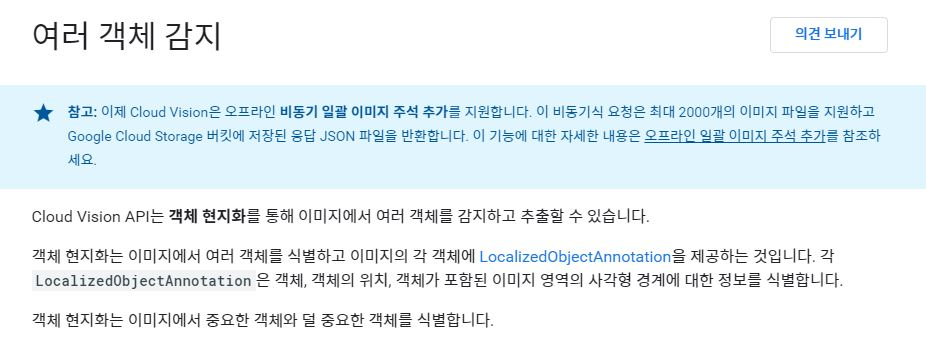

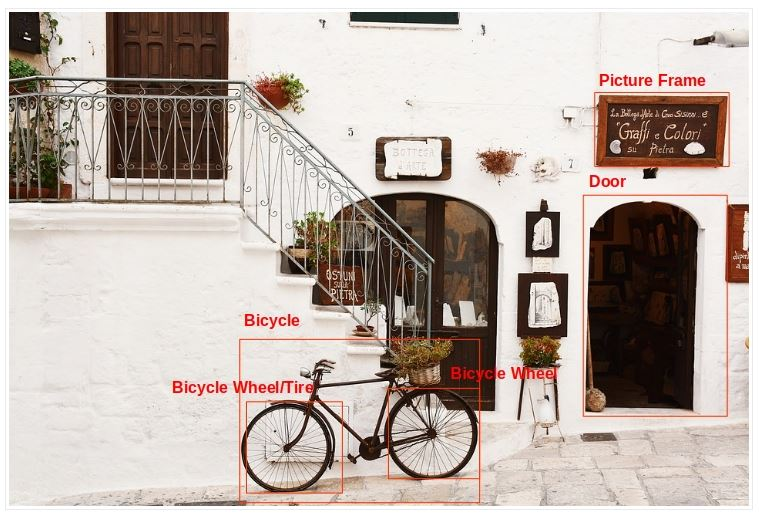

#### vision api는 사진를 보내면 사진에 있는 객체를 탐지하고 위치에 대한 값을 보내준다

### 사진 수집과정
- 원본사진에서 api로 탐지된 객체의 위치로 사진을 잘라서 개별적으로 저장하였다

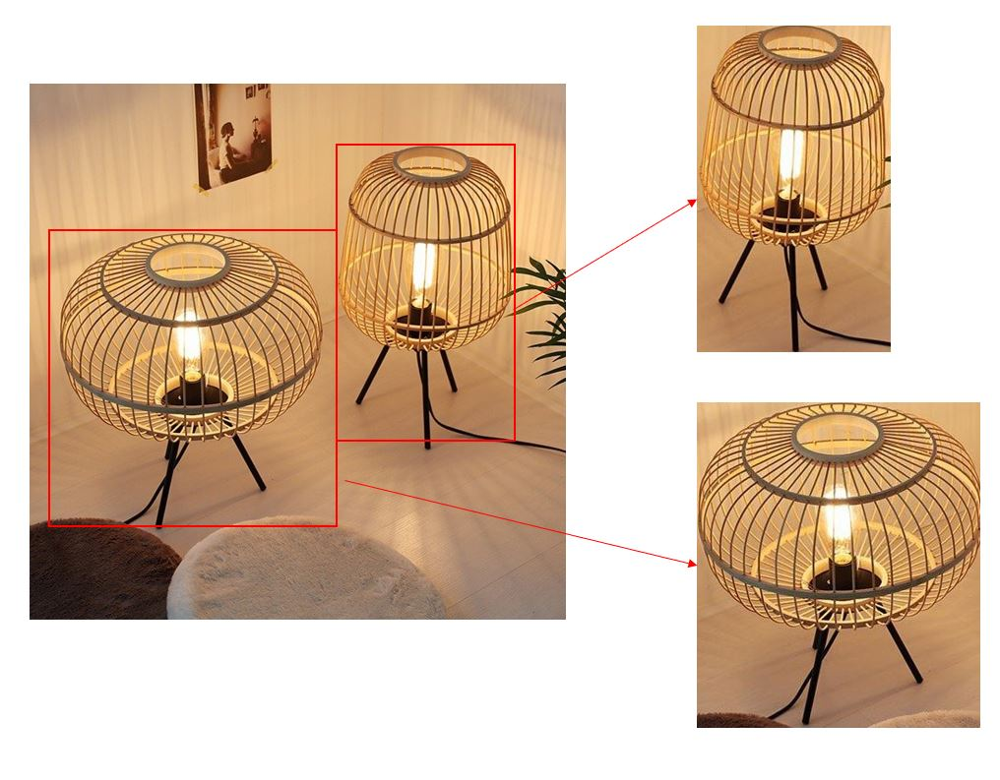

In [ ]:
import gcloud
import os
from google.cloud import vision

In [ ]:
c_path = 'C://Users/Owner/Documents/SPARK-LAB-b19f46a605d3.json'
os.environ['GOOGLE_APPLICATION_CREDENTIALS'] = c_path
client = vision.ImageAnnotatorClient()

In [32]:
class Vision:
    
    def __init__(self):
        self.data = []
    
    def im_trim(self):  # 함수로 만든다
        img = self.img.copy()
        path = 'C://Code/03_crawlling/ohome_img/'
        img2 = img.crop((self.x, self.y, self.w, self.h ))
        try :
            img2.save(path+self.img_name+".jpg")
        except:
            pass
        
        

    def localize_objects_uri(self,uri, Id):
            """Localize objects in the image on Google Cloud Storage

            Args:
            uri: The path to the file in Google Cloud Storage (gs://...)
            """
            from google.cloud import vision
            from io import BytesIO
            from PIL import Image

            client = vision.ImageAnnotatorClient()

            image = vision.types.Image()
            image.source.image_uri = uri
        
            objects = client.object_localization(
                image=image).localized_object_annotations
            count = 1
            
            response = requests.get(uri)
            self.img = Image.open(BytesIO(response.content))
            size = self.img.size[0]
            for object_ in objects:

                if (object_.name == "Lighting") & (count==1):
                    self.x = int(round(object_.bounding_poly.normalized_vertices[0].x*size, 0))
                    self.y = int(round(object_.bounding_poly.normalized_vertices[0].y*size, 0))
                    self.w = int(round(object_.bounding_poly.normalized_vertices[2].x*size, 0)) 
                    self.h = int(round(object_.bounding_poly.normalized_vertices[2].y*size, 0)) 
                    print(self.x,self.y,self.w,self.h)
                    self.img_name = Id
                    trim_image = self.im_trim()
                    
                    count += 1
                elif (object_.name == "Lighting") & (count>1):
                    self.x = int(round(object_.bounding_poly.normalized_vertices[0].x*size, 0))
                    self.y = int(round(object_.bounding_poly.normalized_vertices[0].y*size, 0))
                    self.w = int(round(object_.bounding_poly.normalized_vertices[2].x*size, 0)) 
                    self.h = int(round(object_.bounding_poly.normalized_vertices[2].y*size, 0)) 
                    print(self.x,self.y,self.w,self.h)
                    self.img_name = "{}({})".format(Id, str(count))
                    trim_image = self.im_trim()
                    
                    count += 1


            
        
         

### result데이터 프레임을 iterrows로 던져 ID, 이미지 URL을 얻은뒤, 위에 만들었던 Vision Class를 사용하였다


In [ ]:
for  i, j in result.iterrows():
    uri = str(j["image"])
    Id = str(j["id"])
    vision = Vision()
    vision.localize_objects_uri(uri, Id)

In [ ]:
from glob import glob
images = glob('../03_crawlling/ohome_img/*.jpg')
images

#### 이미지의 총 1307개를 얻었다

In [45]:
len(images)

1307

#### 아이디 값이 unique한 종류의 갯수는 860개이다. 1000개 중 140개는 찾아 내지 못했다

In [46]:
ID = []
for image in images:
    image_name = image.split("\\")[1]
    image_name = image_name.split("(")[0]
    image_name = image_name.split(".")[0]
    ID.append(image_name)
    

In [47]:
len(set(ID))

860

#### 이미지는 폴더에 저장하였고, 사진의 파일명은 제품의 아이디로 저장하였고 동일한 아이디인 사진은 뒤에 번호를 붙여주었다

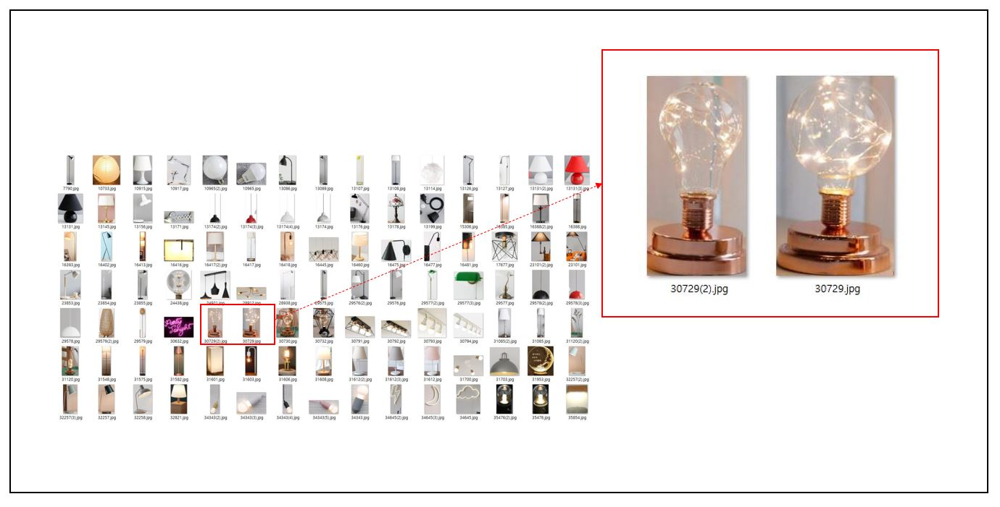

### 이미지 전처리

In [4]:
from glob import glob
images = glob('../03_crawlling/ohome_img/*.jpg')
images[:5]

['../03_crawlling/ohome_img\\100270.jpg',
 '../03_crawlling/ohome_img\\100396(2).jpg',
 '../03_crawlling/ohome_img\\100396.jpg',
 '../03_crawlling/ohome_img\\100405(2).jpg',
 '../03_crawlling/ohome_img\\100405(3).jpg']

### 윤곽추출
- opencv의 findContours를 활용하여 윤곽을 추출하고 추출된 램프 이외의 배경을 흰색으로 덮어주었다.

In [24]:
def blur(path):
    import cv2
    import numpy as np

    #== Parameters =======================================================================
    BLUR = 21
    CANNY_THRESH_1 = 10
    CANNY_THRESH_2 = 50
    MASK_DILATE_ITER = 10
    MASK_ERODE_ITER = 10
    MASK_COLOR = (0.0,0.0,1.0) # In BGR format


    #== Processing =======================================================================

    #-- Read image -----------------------------------------------------------------------
    img = cv2.imread(path)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    #-- Edge detection -------------------------------------------------------------------
    edges = cv2.Canny(gray, CANNY_THRESH_1, CANNY_THRESH_2)
    edges = cv2.dilate(edges, None)
    edges = cv2.erode(edges, None)

    #-- Find contours in edges, sort by area ---------------------------------------------
    contour_info = []
    contours, _ = cv2.findContours(edges, cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)
    # Previously, for a previous version of cv2, this line was: 
    #  contours, _ = cv2.findContours(edges, cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)
    # Thanks to notes from commenters, I've updated the code but left this note
    for c in contours:
        contour_info.append((
            c,
            cv2.isContourConvex(c),
            cv2.contourArea(c),
        ))
    contour_info = sorted(contour_info, key=lambda c: c[2], reverse=True)
    max_contour = contour_info[0]

    #-- Create empty mask, draw filled polygon on it corresponding to largest contour ----
    # Mask is black, polygon is white
    mask = np.zeros(edges.shape)
    cv2.fillConvexPoly(mask, max_contour[0], (255))

    #-- Smooth mask, then blur it --------------------------------------------------------
    mask = cv2.dilate(mask, None, iterations=MASK_DILATE_ITER)
    mask = cv2.erode(mask, None, iterations=MASK_ERODE_ITER)
    mask = cv2.GaussianBlur(mask, (BLUR, BLUR), 0)
    mask_stack = np.dstack([mask]*3)    # Create 3-channel alpha mask

    #-- Blend masked img into MASK_COLOR background --------------------------------------
    mask_stack  = mask_stack.astype('float32') / 255.0          # Use float matrices, 
    img         = img.astype('float32') / 255.0                 #  for easy blending

    masked = (mask_stack * img) + ((1-mask_stack) * MASK_COLOR) # Blend
    masked = (masked * 255).astype('uint8')                     # Convert back to 8-bit 


  

    c_red, c_green, c_blue = cv2.split(img)

    # merge with mask got on one of a previous steps
    img_a = cv2.merge((c_red, c_green, c_blue, mask.astype('float32') / 255.0))



    write_name = path.split("/")[-1].split("\\")[-1]
    # save to disk
    cv2.imwrite('C://Code/03_crawlling/ohome_img_blur/'+write_name+".png", img_a*255)



In [30]:
for image in images:
    blur(image)

### 전처리 결과

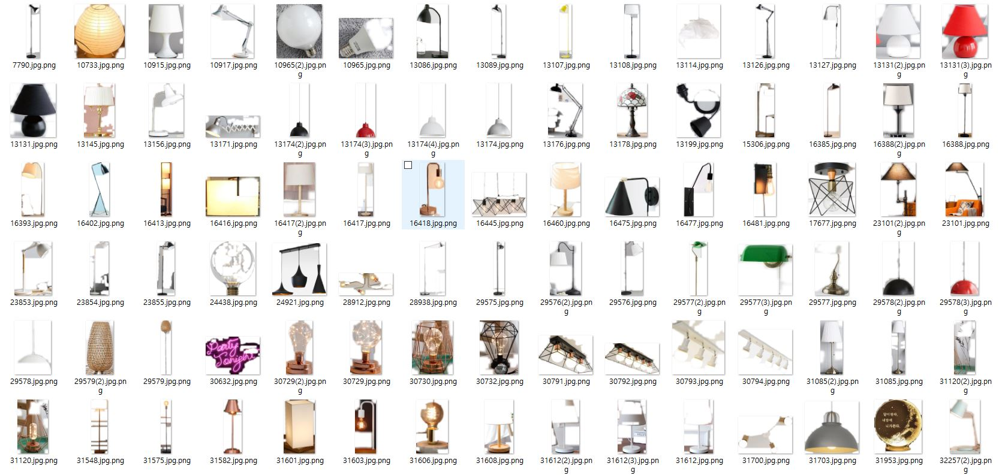

### first-trial(mahotas)

In [8]:
# mahotas 입력
import mahotas as mh

In [15]:
# haralick 적용
features = []

for im in images:
    
    im = mh.imread(im)
    im = mh.colors.rgb2gray(im, dtype=np.uint8)
    features.append(mh.features.haralick(im).ravel())

In [16]:
# distance로 유사도 측정
from scipy.spatial import distance
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
features = sc.fit_transform(features)

dists = distance.squareform(distance.pdist(features))

In [17]:
# n번째 이미지와 유사한 이미지 찾기 순위대로 찾아주는함수
def selectImage(n, m, dists, images):
    image_position = dists[n].argsort()[m]
    image = mh.imread(images[image_position])
    return image

In [20]:
# 선택된 이미지 출력 함수
def plotImages(n, m):
    fig, ax = plt.subplots(1,m, figsize=(15,5))
    
    for i in range(m):
        ax[i].imshow(selectImage(n, i, dists, images))
        ax[i].set_xticks([])
        ax[i].set_yticks([])
        
    plt.show()

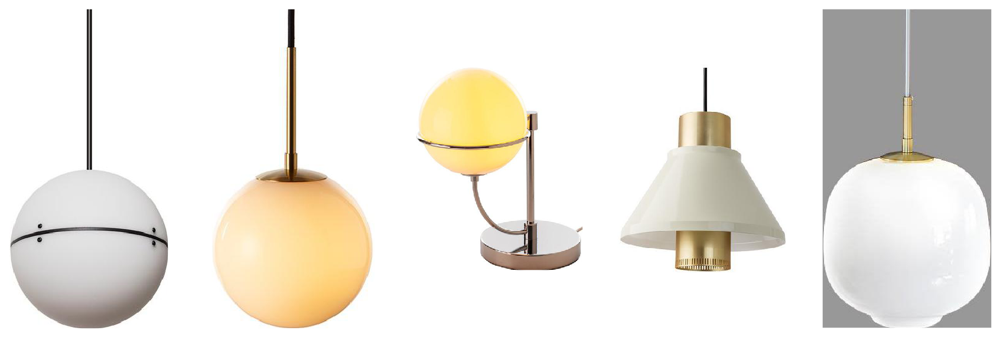

In [21]:
plotImages(14, 5)

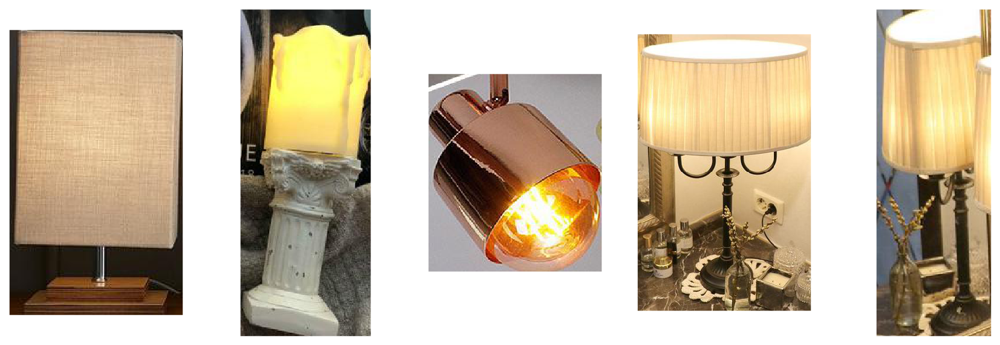

In [22]:
plotImages(12, 5)

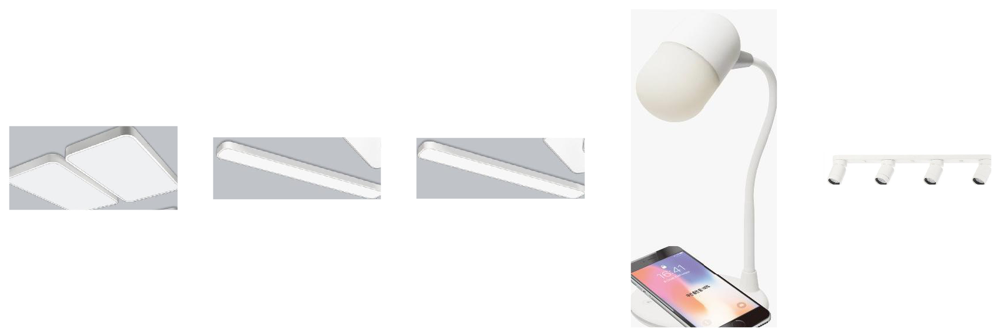

In [23]:
plotImages(300, 5)

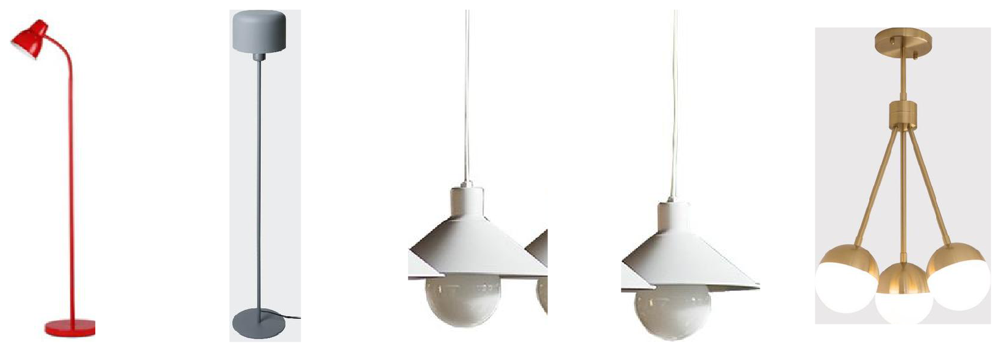

In [25]:
plotImages(100 ,5)

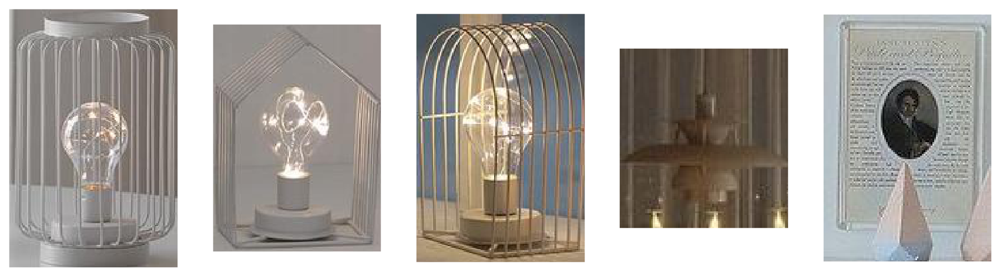

In [26]:
plotImages(60, 5)

### 전처리된 이미지 유사도 

In [5]:
from glob import glob
images_blur = glob('../03_crawlling/ohome_img_blur/*.png')
images_blur[:5]

['../03_crawlling/ohome_img_blur\\100270.jpg.png',
 '../03_crawlling/ohome_img_blur\\100396(2).jpg.png',
 '../03_crawlling/ohome_img_blur\\100396.jpg.png',
 '../03_crawlling/ohome_img_blur\\100405(2).jpg.png',
 '../03_crawlling/ohome_img_blur\\100405(3).jpg.png']

### imges_blur의 이미지는 실제로 RGB 값위에 한겹을 더씌워 blur처리가 되었다

In [14]:
mh.imread(images_blur[0])[0][:10]

array([[ 79,  55,  43,   0],
       [ 94,  70,  58,   0],
       [109,  85,  73,   0],
       [112,  88,  76,   0],
       [109,  87,  73,   0],
       [108,  86,  72,   0],
       [108,  86,  72,   0],
       [106,  84,  70,   0],
       [102,  83,  69,   0],
       [103,  84,  70,   0]], dtype=uint8)

### 4차원을 3차원으로 빠꾸고

In [27]:
features = []
for img in images_blur:
    img = mh.imread(img)
    img = img.tolist()
    for idx in range(len(img)):
        im = img[idx]
        for i in range(len(im)):
            if img[idx][i][3] > 50:
                img[idx][i] = img[idx][i][0:3]
            else:
                img[idx][i] = [0,0,0]
            
            
    im = np.array(img)
    im = mh.colors.rgb2gray(im, dtype=np.uint8)
    features.append(mh.features.haralick(im).ravel())

In [28]:
from scipy.spatial import distance
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
features = sc.fit_transform(features)

dists = distance.squareform(distance.pdist(features))

In [29]:
def selectImage_blur(n, m, dists, images_blur):
    image_position = dists[n].argsort()[m]
    image = mh.imread(images_blur[image_position])
    return image

In [30]:
def plotImages_blur(n, m):
    fig, ax = plt.subplots(1,m, figsize=(15,5))
    
    for i in range(m):
        ax[i].imshow(selectImage_blur(n, i, dists, images_blur))
        ax[i].set_xticks([])
        ax[i].set_yticks([])
        
    plt.show()

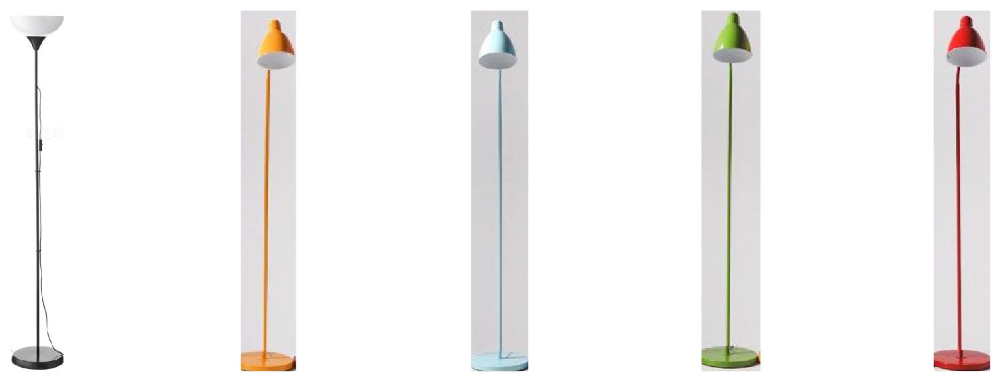

In [31]:
plotImages(200, 5)

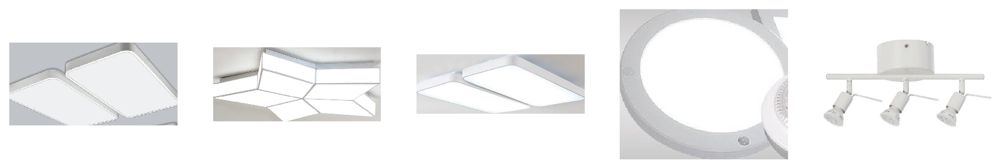

In [32]:
plotImages(300, 5)

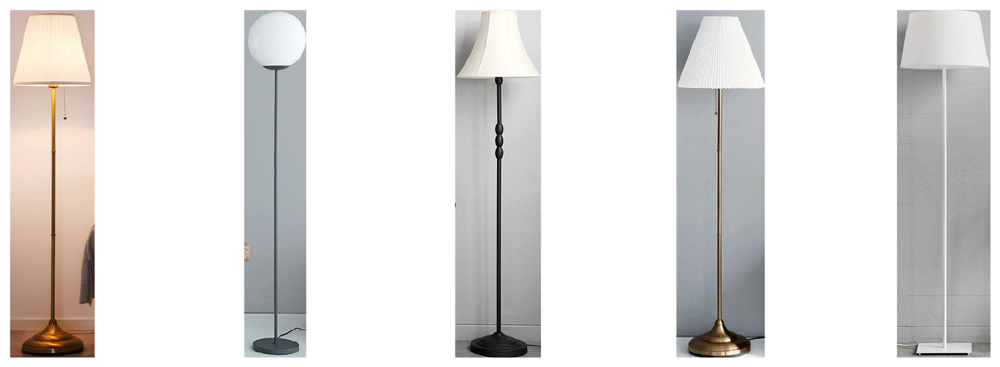

In [33]:
plotImages(195, 5)

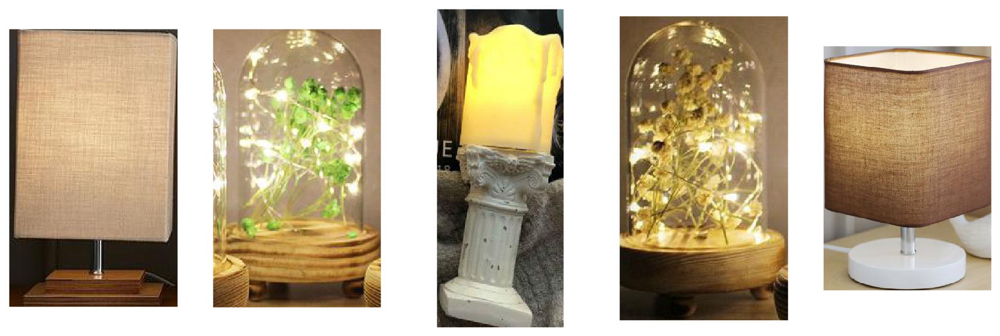

In [34]:
plotImages(12, 5)

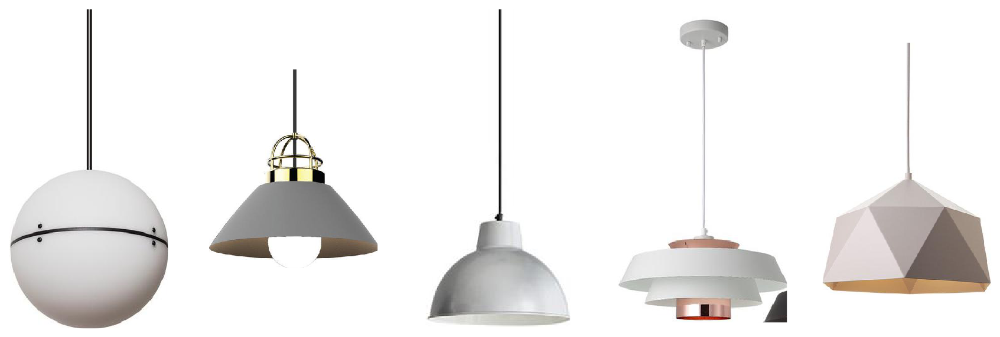

In [35]:
plotImages(14, 5)

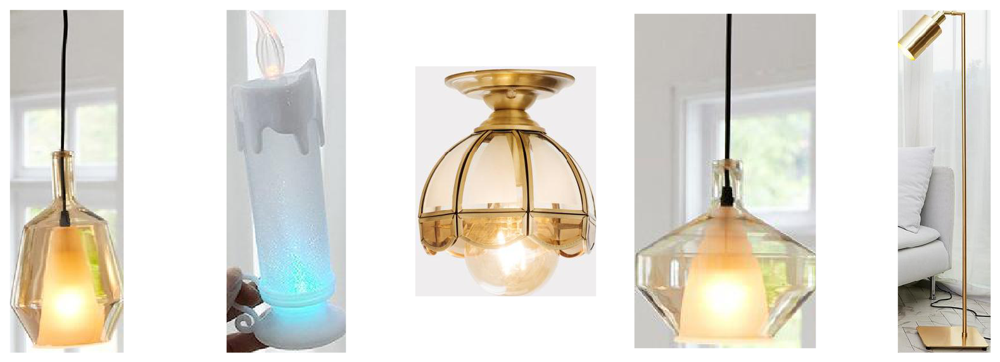

In [36]:
plotImages(3, 5)

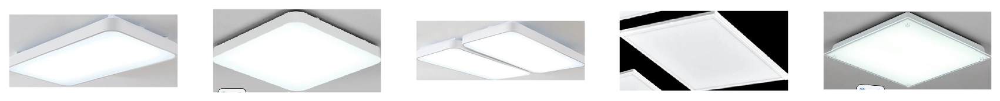

In [37]:
plotImages(41, 5)

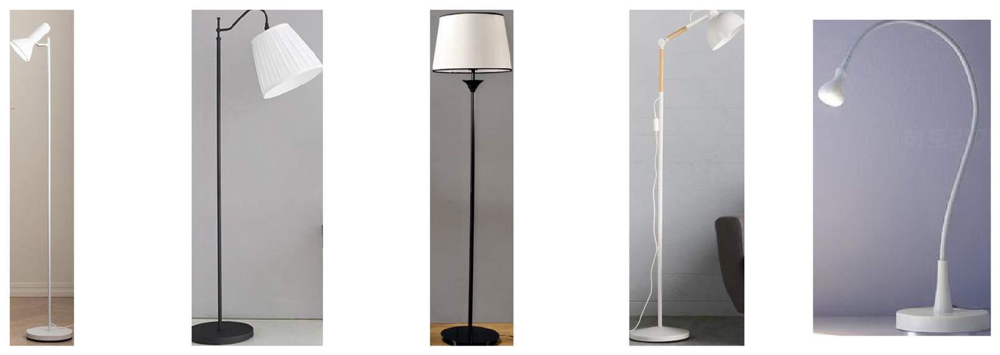

In [38]:
plotImages(103, 5)

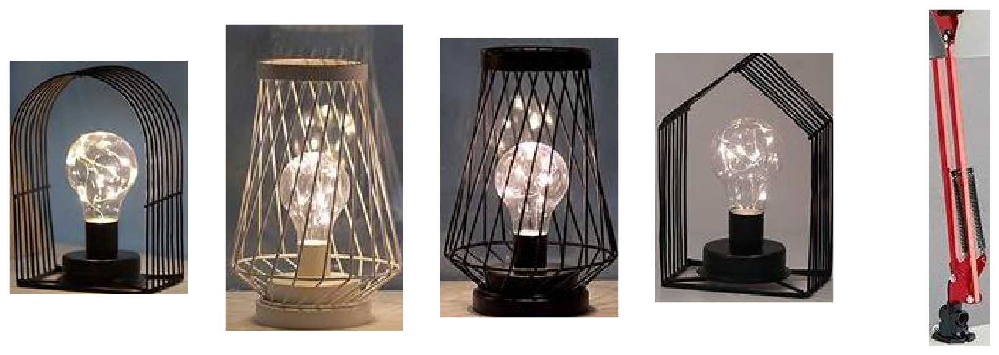

In [39]:
plotImages(56, 5)

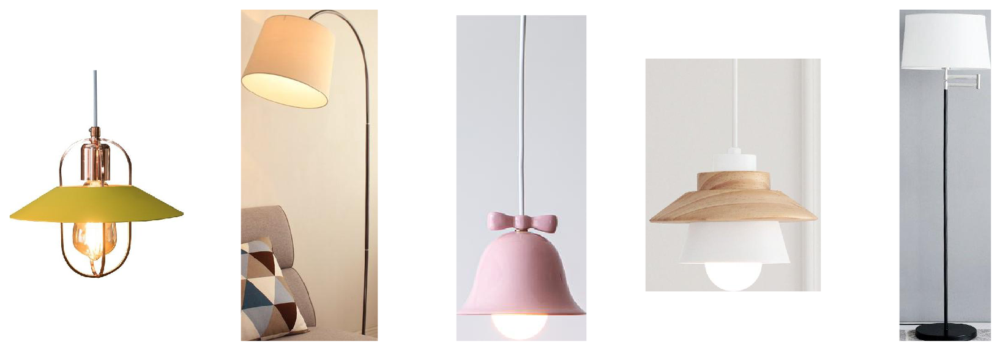

In [40]:
plotImages(665, 5)

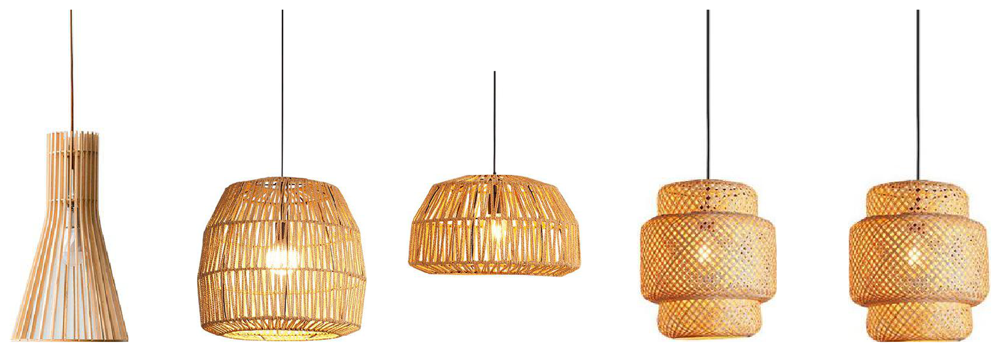

In [41]:
plotImages(130, 5)

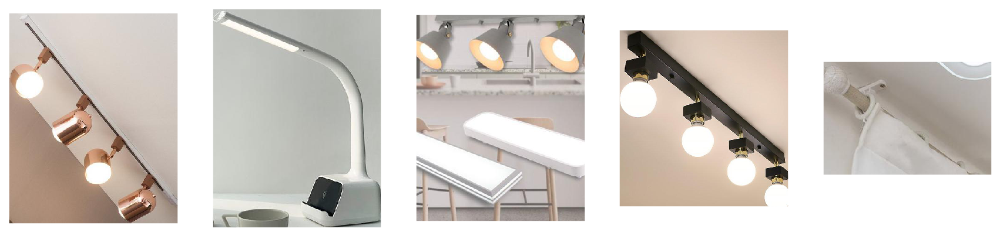

In [44]:
plotImages(221, 5)

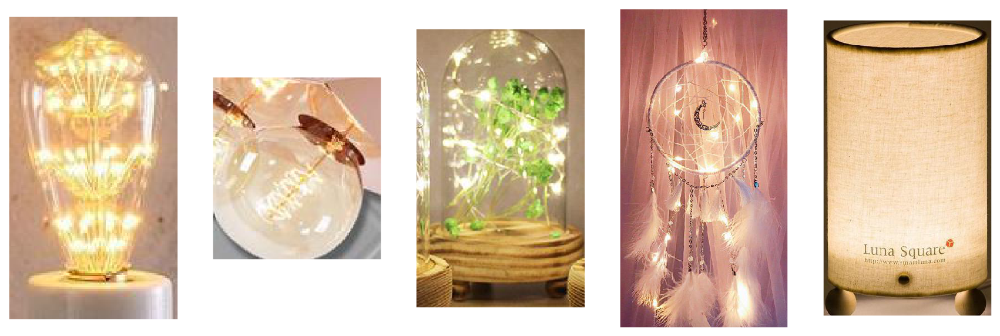

In [49]:
plotImages(126,5)

### PCA 유클리드 거리

In [50]:
def find_similar_eud(filename, n,k):
    

    length = len(filename)
    
    
    def get_pca_data(n):
        filename = []
        pics = []
        for file in os.listdir():
            realfile = pwd + '\\' + file
            filename.append(realfile)
            pics.append(np.array(Image.open(realfile).resize((200,200))).reshape(1,-1))
        new_ = np.array(pics).reshape(length, -1)
        
        pca100 = PCA(n_components= n)
        new_pics = pca100.fit_transform(new_)
        new_pics = new_pics.reshape(length, 1, 100)
        return new_pics
    
    def get_distance():
        dist = []
        for x in new_pics:
            for y in new_pics:
                dist.append(euclidean_distances(x,y))
        return np.array(dist).reshape(length, length)
        
        
    
    def get_k_closest_images_from_nth(filename, array, n, k):
        '''filename = 파일이름의 리스트
            array = new_pics
            n = n번째 사진
            k = k개 만큼 '''
        idx = array[n].argsort()[1:k+1]
        file_names = []
        for i in idx:
            file_names.append(filename[i])
        return file_names
    
    def openImages(n, img_list, filename):
        fig, ax = plt.subplots(1,6, figsize=(15,5))
        im = cv2.imread(filename[n])
        ax[0].imshow(im)
        ax[0].set_xticks([])
        ax[0].set_yticks([])
        for i, img in enumerate(img_list):
            im = cv2.imread(img)
            ax[i+1].imshow(im)
            ax[i+1].set_xticks([])
            ax[i+1].set_yticks([])
            
        plt.show()
    
    pr
    new = get_pca_data(n)
    distance_matrix = get_distance(new)
    close_images = get_k_closest_images_from_nth(filename, distance_matrix, n, k)
    openImages(n, close_images, filename)

In [57]:
import os
from PIL import Image

pwd = os.getcwd()
filename = []
pics = []
for file in os.listdir():
    realfile = pwd + '\\' + file
    filename.append(realfile)
    pics.append(np.array(Image.open(realfile).resize((200,200))).reshape(1,-1))
new_ = np.array(pics).reshape(1273, -1)

from sklearn.decomposition import PCA


In [58]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
pca100 = PCA(n_components= 100)
new_pics = pca100.fit_transform(new_)

In [59]:
new_pics = new_pics.reshape(1273, 1, 100)

In [60]:
new_pics.shape

(1273, 1, 100)

In [61]:
from sklearn.metrics.pairwise import euclidean_distances
dist = []
for x in new_pics:
    for y in new_pics:
        dist.append(euclidean_distances(x,y))
        
        




In [62]:
dist = np.array(dist)
reshape_dist = dist.reshape(1273,1273)

In [63]:

def get_k_closest_images_from_nth(filename, array, n, k):
    '''filename = 파일이름의 리스트
        array = new_pics
        n = n번째 사진
        k = k개 만큼 '''
    idx = array[n].argsort()[1:k+1]
    file_names = []
    for i in idx:
        file_names.append(filename[i])
    return file_names





In [64]:

def openImages(n, k, reshape_dist, filename):
    
    img_list = get_k_closest_images_from_nth(filename, reshape_dist,  n,k)
    fig, ax = plt.subplots(1,k+1, figsize=(15,5))
    im = mh.imread(filename[n])
    ax[0].imshow(im)
    ax[0].set_xticks([])
    ax[0].set_yticks([])
    
    for i, img in enumerate(img_list):
        im = mh.imread(img)
        ax[i+1].imshow(im)
        ax[i+1].set_xticks([])
        ax[i+1].set_yticks([])
        
    plt.show()
    
 
    

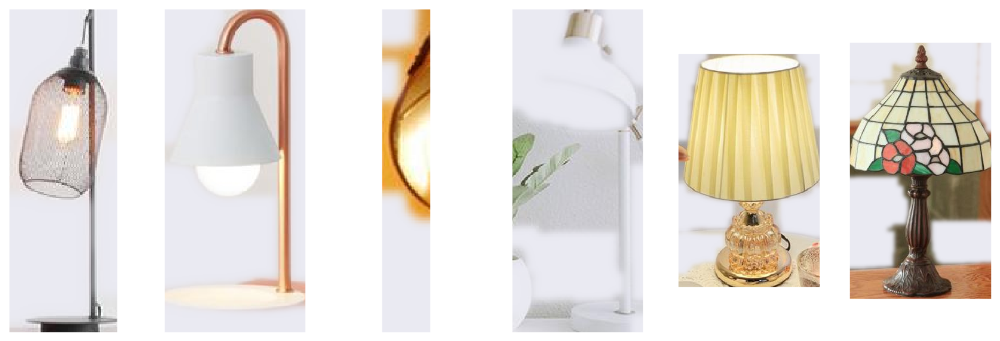

In [65]:
openImages(n = 135, k=5, reshape_dist = reshape_dist, filename = filename)

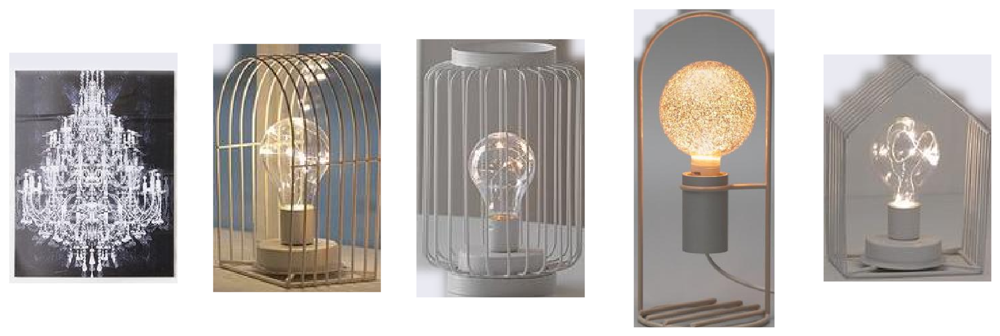

In [295]:
openImages(n = 133, k=4, reshape_dist = reshape_dist, filename = filename)

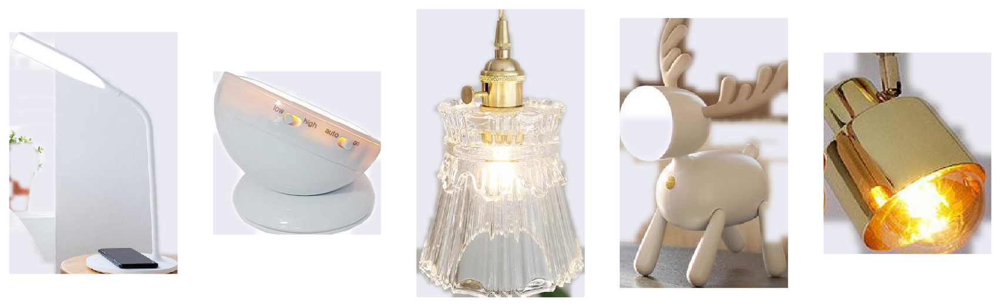

In [296]:
openImages(n = 155, k=4, reshape_dist = reshape_dist, filename = filename)

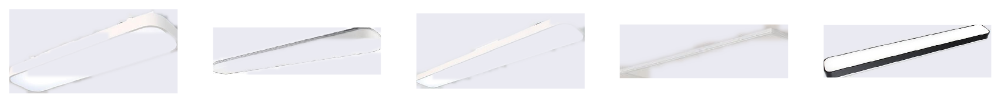

In [297]:
openImages(n = 45, k=4, reshape_dist = reshape_dist, filename = filename)

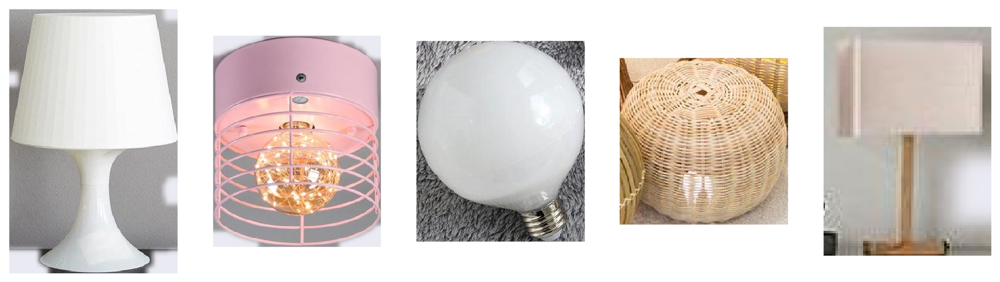

In [298]:
openImages(n = 33, k=4, reshape_dist = reshape_dist, filename = filename)

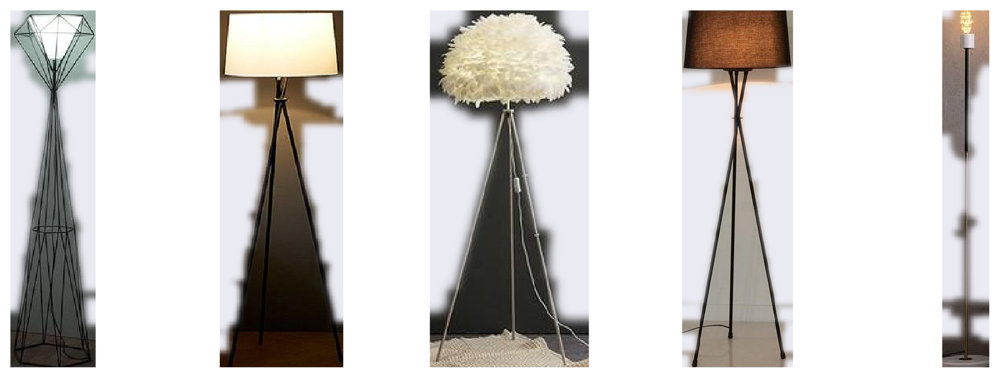

In [299]:
openImages(n = 93, k=4, reshape_dist = reshape_dist, filename = filename)

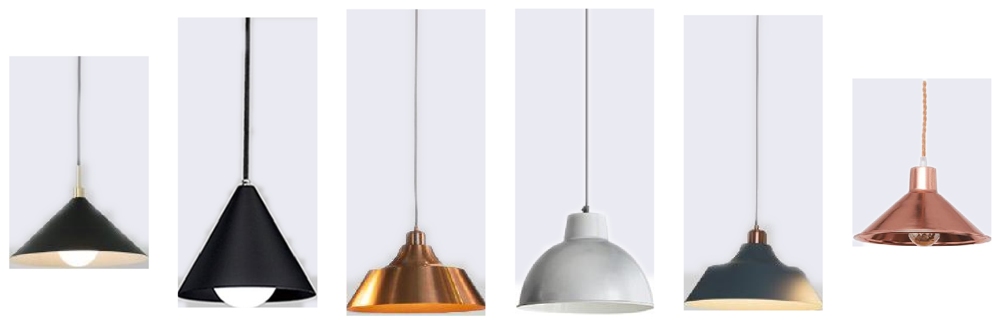

In [66]:
openImages(n = 283, k=5, reshape_dist = reshape_dist, filename = filename)

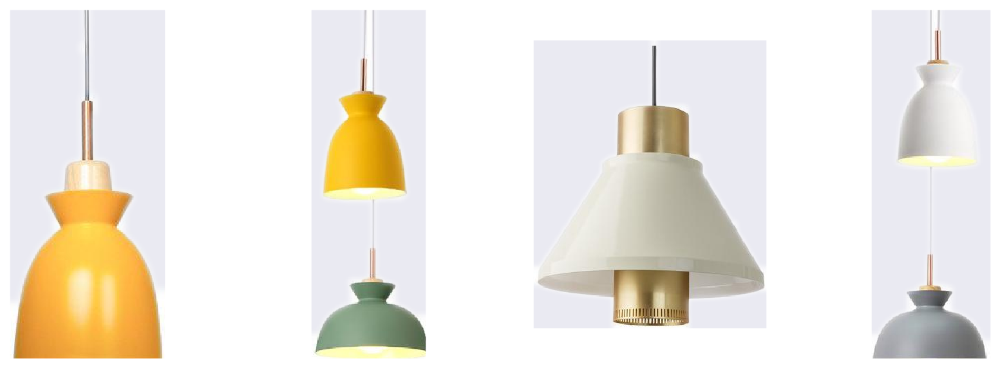

In [320]:
plotImages(75)

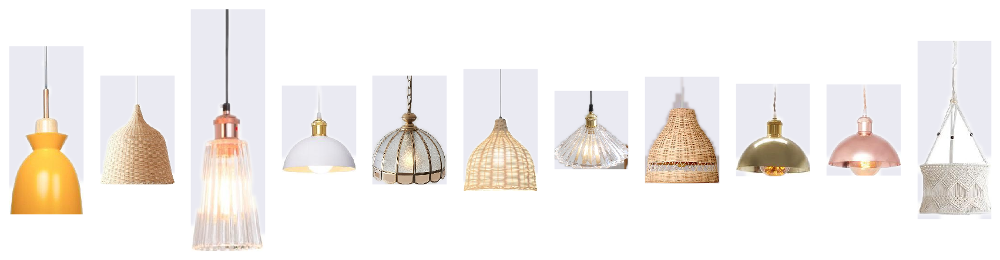

In [321]:
openImages(n = 75, k=10, reshape_dist = reshape_dist, filename = filename)

### 비슷한 제품의 정보를 알려주는 데이터 프레임 출력

In [403]:
def get_df(filename, reshape_dist, n, k):
    l = get_k_closest_images_from_nth(filename, reshape_dist, n, k)
    ID = []
    for image in l:
        image_name = image.split("\\")[4]
        image_name = image_name.split("(")[0]
        image_name = image_name.split(".")[0]
        ID.append(image_name)
    df = pd.read_csv("./오늘의집 정보")
    result = df[df.id.isin(ID)]
    return result

### 유사한 램프정보
- 334번과 유사한 5가지의 램프정보를 반환

In [404]:
get_df(filename, reshape_dist, 344, 5)

,Unnamed: 0,id,brand,product_name,delivery,image,original_price,price,page_link
64,64,142551,히트조명,베니스 1등 팬던트 조명_3colors,False,https://image.ohou.se/image/central_crop/bucke...,52800,30000,https://ohou.se/productions/142551/selling?aff...
372,372,230859,공간LED,다이아나 1등 펜던트조명_4 color,False,https://image.ohou.se/image/central_crop/bucke...,14000,12600,https://ohou.se/productions/230859/selling?aff...
708,708,242406,공간조명,스텔 1등 펜던트_3colors,True,https://image.ohou.se/image/central_crop/bucke...,65000,58000,https://ohou.se/productions/242406/selling?aff...
719,719,13174,마켓비,RIBOWL 펜던트등 4colors E26(KS1972D),False,https://image.ohou.se/image/central_crop/bucke...,19900,19100,https://ohou.se/productions/13174/selling?affe...
773,773,254810,공간조명,코코 라탄 1등 펜던트_소사이즈,True,https://image.ohou.se/image/central_crop/bucke...,94500,80000,https://ohou.se/productions/254810/selling?aff...
